<a href="https://colab.research.google.com/github/DrYGuo/Defect-detection-in-atomic-resolution-image-via-unsupervised-learning-with-translational-invariance/blob/main/Testing_a_monoclinic_STEM_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Read tif and display the image

In [1]:
path='/content/drive/Shareddrives/TMD_NIST/Monoclinic structure for defect detection/ZrO2_monoclinic.tif'


In [2]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import scipy


In [3]:
plt.set_cmap('gray')

<Figure size 432x288 with 0 Axes>

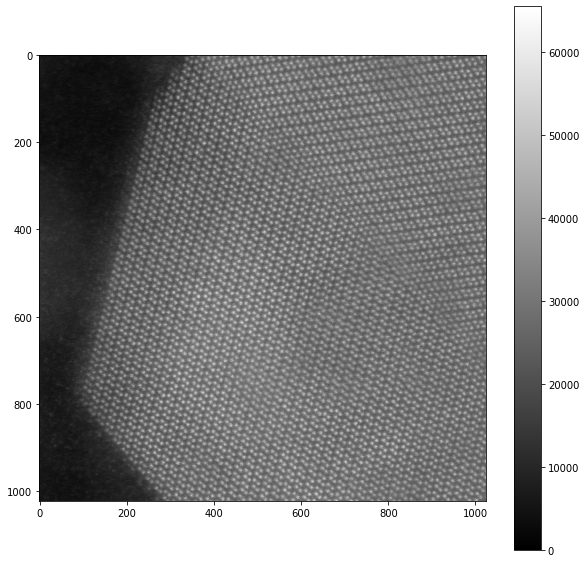

In [4]:
image = Image.open(path)
ZrO2=np.array(image)
plt.figure(figsize=(10,10))
plt.imshow(ZrO2,cmap='gray')
plt.colorbar()

edge detection

In [5]:
# plt.hist(ZrO2,bins=100)

#FFT

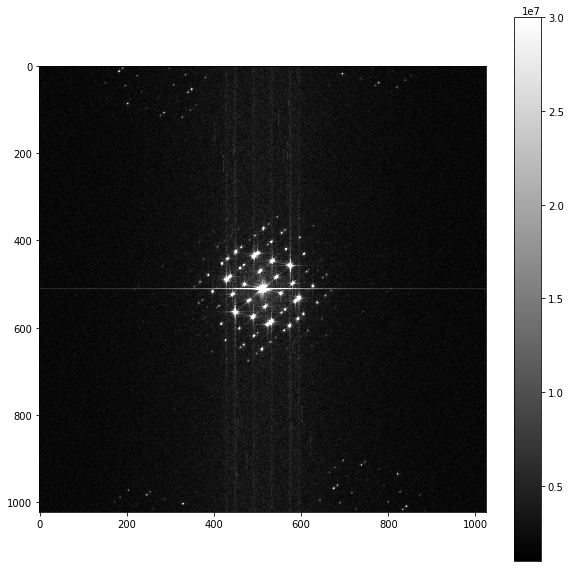

In [6]:
subimage_1=ZrO2[1023-256:1023,1023-256:1023]
subimage_2=ZrO2[:128,:128]
FFT=scipy.fft.fft2(ZrO2)
FFT_shift=scipy.fft.fftshift(FFT)
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift),vmax=0.3e8,vmin=0.1e7)
plt.colorbar()

Get FFT_size

In [7]:
FFT_X=FFT.shape[0]
FFT_Y=FFT.shape[1]
print(FFT_X,FFT_Y)

#creat a new FFT_shift so that the new one has excluded the spurious peaks at high frequencies
FFT_shift_new=np.zeros((FFT_X,FFT_Y),dtype=complex)
FFT_shift_new[int(FFT_X/4):int(3*FFT_X/4),int(FFT_Y/4):int(3*FFT_Y/4)]=FFT_shift[int(FFT_X/4):int(3*FFT_X/4),int(FFT_Y/4):int(3*FFT_Y/4)]


1024 1024


(1024, 1024)


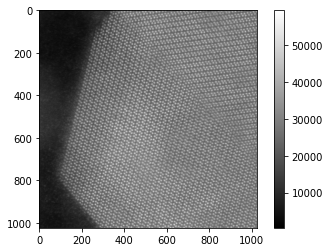

In [8]:
IFFT_image=scipy.fft.ifft2(FFT_shift_new)

plt.imshow(abs(IFFT_image))
plt.colorbar()
print(IFFT_image.shape)

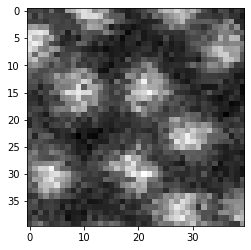

In [9]:
plt.imshow(ZrO2[512:552,512:552])

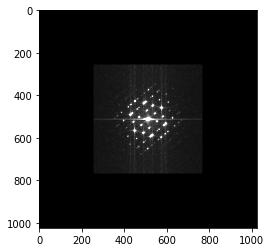

In [10]:
plt.imshow(abs(FFT_shift_new),vmax=3e7)

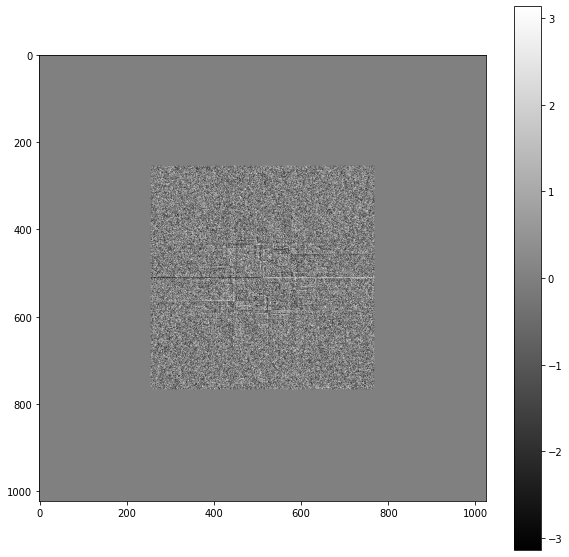

In [11]:
plt.figure(figsize=(10,10))
plt.imshow(np.angle(FFT_shift_new))
plt.colorbar()

(69, 2)


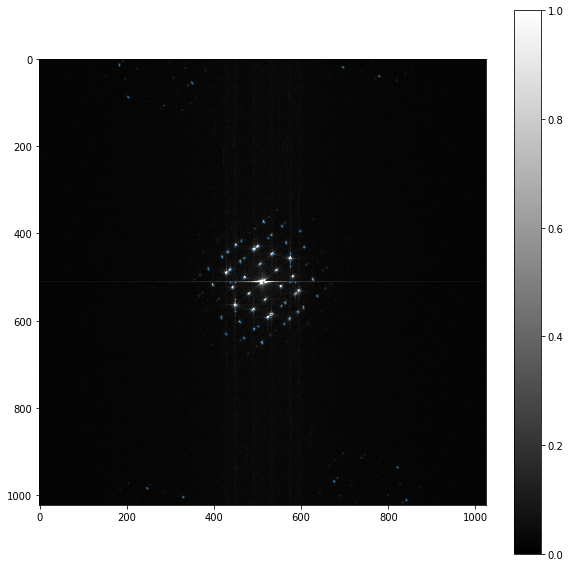

In [12]:
from skimage.feature import peak_local_max
FFT_peaks= peak_local_max(abs(FFT_shift), min_distance=5,threshold_abs=5e7)
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift),vmax=1e8)
plt.scatter(FFT_peaks[:,1],FFT_peaks[:,0],s=1)
plt.colorbar()
print(FFT_peaks.shape)

# Segment the image into unit cells according to FFT

In [13]:
import math
k_distance=np.zeros((FFT_peaks.shape[0]))
k_peaks=np.zeros((FFT_peaks.shape[0],3))
print(k_peaks.shape)
for i, (x,y) in enumerate(FFT_peaks):
  k_distance[i]=math.sqrt((x-FFT_X/2)**2+(y-FFT_Y/2)**2)
  k_peaks[i,:]=(x,y,k_distance[i])
  # print(x,y,k_distance[i])
# print(k_distance)
print(k_peaks)
print('sorted')
sorted_k_peaks=k_peaks[k_peaks[:,2].argsort()] # sort k_peaks by the second column, k_distance
print(sorted_k_peaks)
print('k_peaks: row, col,length')
print(k_peaks)

(69, 3)
[[1011.          841.          597.69724778]
 [1005.          329.          525.86880493]
 [ 984.          246.          541.79331853]
 [ 969.          675.          485.19892828]
 [ 936.          821.          524.64940675]
 [ 651.          510.          139.01438774]
 [ 640.          468.          135.35139453]
 [ 630.          427.          145.42695761]
 [ 620.          492.          109.83624174]
 [ 613.          500.          101.71037312]
 [ 607.          561.          106.89246933]
 [ 603.          459.          105.30906894]
 [ 597.          573.          104.6231332 ]
 [ 593.          524.           81.88406438]
 [ 593.          417.          124.84390253]
 [ 586.          532.           76.65507159]
 [ 581.          592.          105.64563408]
 [ 579.          449.           91.96738552]
 [ 576.          490.           67.67569726]
 [ 570.          605.          109.60383205]
 [ 567.          555.           69.8140387 ]
 [ 566.          449.           82.97590012]
 [

In [14]:
k_vectors=np.zeros((6,2))

for i in range(6):
   k_vectors[i,0]=sorted_k_peaks[i+1,0]-FFT_X/2
   k_vectors[i,1]=sorted_k_peaks[i+1,1]-FFT_Y/2

print(k_vectors)

[[-41.  -6.]
 [ 41.   6.]
 [-27.  32.]
 [ 27. -32.]
 [-10. -42.]
 [ 10.  42.]]


**NOTE: the k_vectors do not form a closed triangle, which means that there are two basis unit vectors. We take one of the bases**

In [15]:
k_vectors=k_vectors[2:,:]
print(k_vectors)

[[-27.  32.]
 [ 27. -32.]
 [-10. -42.]
 [ 10.  42.]]


In [16]:
window=np.zeros((55,55))
shift_center=math.floor(window.shape[0]/2)
cos_alpha_list=np.zeros((k_vectors.shape[0]))
sin_alpha_list=np.zeros((k_vectors.shape[0]))

for i in range(k_vectors.shape[0]):
  cos_alpha_list[i]=k_vectors[i,0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
  sin_alpha_list[i]=k_vectors[i,1]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
print(cos_alpha_list)

[-0.64487094  0.64487094 -0.23162053  0.23162053]


From the nearest reciprocal vectors, we can get the d_spacing of each unit cell. The shape and size of the unit cell is shown in the window.

[Reference of the calculation](https://www.math-only-math.com/straight-line-in-normal-form.html#:~:text=(i)%20The%20equation%20of%20a,%E2%89%A4%20%CE%B1%E2%89%A4%20360%C2%B0.)

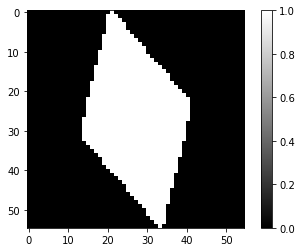

In [17]:
for x in range(window.shape[0]):
  for y in range(window.shape[1]):
     count=0
     for i in range(4):
        d_spacing=ZrO2.shape[0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
        if abs((x-shift_center)*cos_alpha_list[i]+(y-shift_center)*sin_alpha_list[i])<=d_spacing/2+1:
           count=count+1
           
     if count==4:
       window[x,y]=1

plt.imshow(window)
plt.colorbar()



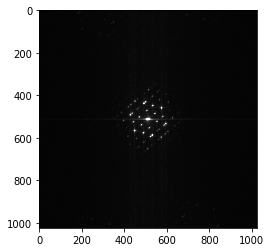

In [18]:
plt.imshow(abs(FFT_shift),vmax=1e8)

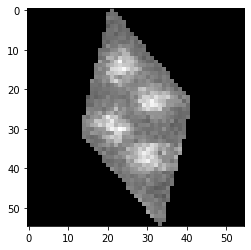

In [19]:
plt.imshow(ZrO2[512:512+window.shape[0],510:510+window.shape[1]]*window)

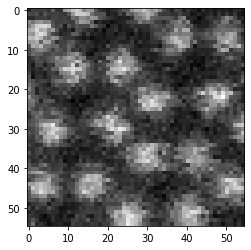

In [20]:
plt.imshow(ZrO2[512:512+window.shape[0],510:510+window.shape[1]])

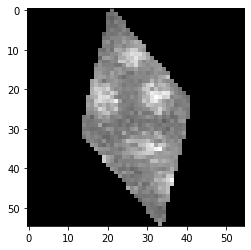

In [21]:
plt.imshow(ZrO2[:window.shape[0],1024-window.shape[1]-2:1024-2]*window)

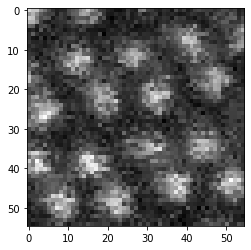

In [22]:
plt.imshow(ZrO2[:window.shape[0],1024-window.shape[1]-2:1024-2])

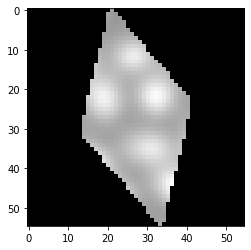

In [23]:
ZrO2_smoothed=scipy.ndimage.gaussian_filter(ZrO2,sigma=2)
plt.imshow(ZrO2_smoothed[:window.shape[0],1024-window.shape[1]-2:1024-2]*window)

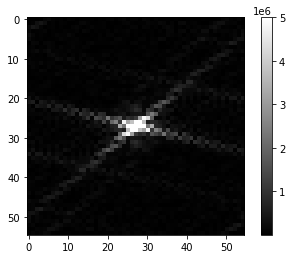

In [24]:
plt.imshow(abs(scipy.fft.fftshift(scipy.fft.fft2(ZrO2_smoothed[:window.shape[0],1024-window.shape[1]-2:1024-2]*window))),vmax=5e6)
plt.colorbar()

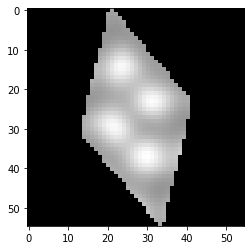

In [25]:
plt.imshow(ZrO2_smoothed[512:512+window.shape[0],510:510+window.shape[1]]*window)

Now, we need to segment out STEM image into subimages with each contains one unit cell.
To do so, we need to find the a and c unit vectors in real space (the monoclinic material is in the STEM is ). Then we refine the position by minimizing the circumferential integral. 

In [26]:
r_vectors=np.zeros((4,2))
for i in range(4):
   d_spacing=ZrO2.shape[0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
   r_vectors[i,0]=-(d_spacing/2)/cos_alpha_list[i]
   r_vectors[i,1]=(d_spacing/2)/sin_alpha_list[i]
print('tranlation by')
print(r_vectors)

tranlation by
[[ 18.96296296  16.        ]
 [-18.96296296 -16.        ]
 [ 51.2        -12.19047619]
 [-51.2         12.19047619]]


531 586
526 581


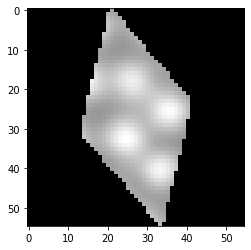

In [27]:
test1=ZrO2_smoothed[512+round(r_vectors[0,0]):512+window.shape[0]+round(r_vectors[0,0]),510+round(r_vectors[0,1]):510+window.shape[1]+round(r_vectors[0,1])]*window
plt.imshow(test1)
print(512+round(r_vectors[0,0]),512+window.shape[0]+round(r_vectors[0,0]))
print(510+round(r_vectors[0,1]),510+window.shape[1]+round(r_vectors[0,1]))
# plt.imshow(ZrO2_smoothed[512+round(r_vectors[0,0]):512+window.shape[0]+round(r_vectors[0,0]),510+round(r_vectors[0,1]):510+window.shape[1]+round(r_vectors[0,1])]*window)

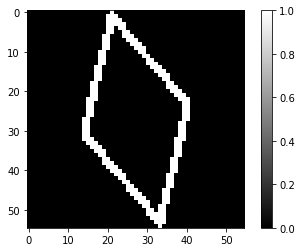

In [28]:
window2=np.zeros((window.shape[0],window.shape[1]))
ring=window.copy()
for x in range(window.shape[0]):
  for y in range(window.shape[1]):
     count=0
     for i in range(4):
        d_spacing=ZrO2.shape[0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
        if abs((x-shift_center)*cos_alpha_list[i]+(y-shift_center)*sin_alpha_list[i])<=d_spacing/2-1:
           count=count+1
           
     if count==4:
       window2[x,y]=1

ring=window-window2
plt.imshow(ring)
plt.colorbar()



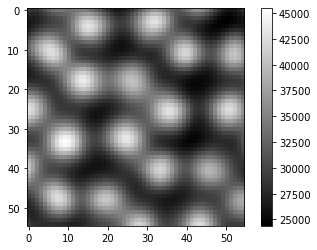

In [29]:
plt.imshow(ZrO2_smoothed[531:586,526:581])
plt.colorbar()

Test for finding the optimized segmented image by minimizing the circular integral over the circumference

In [30]:
round(26.5)

26

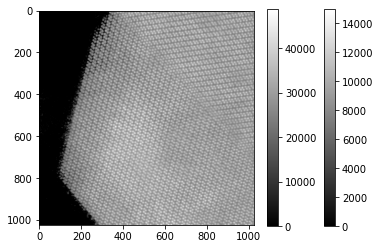

In [31]:
plt.imshow(ZrO2,vmax=1.5e4)
plt.colorbar()
particle_mask=np.zeros((1024,1024))
particle_mask[np.where(ZrO2[:,:]>=1.6e4)]=1
plt.imshow(particle_mask)

plt.imshow(particle_mask)
im=ZrO2_smoothed*particle_mask
plt.imshow(im)
plt.colorbar()

517 519


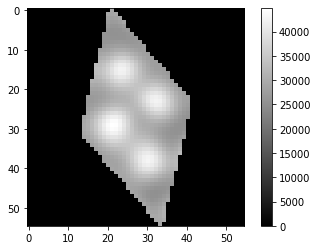

In [32]:
def crop_unit_cell(im,CX,CY): #cropped_unit_cell,area_min,i_opt,j_opt
  area_min=1e10
  for i in range(-15,15):
    for j in range(-15,15):
      integral=im[int(CX-i-window.shape[0]/2):int(CX+window.shape[0]/2-i),int(CY-j-window.shape[1]/2):int(CY+window.shape[1]/2-j)]*ring
      area=np.matrix(integral).sum()
    # print(area)
      if area < area_min:
         i_opt=i
         j_opt=j
         area_min=area
      #  print(area)
  
  cropped_unit_cell=im[int(CX-i_opt-window.shape[0]/2):int(CX-i_opt+window.shape[0]/2),int(CY-j_opt-window.shape[1]/2):int(CY+window.shape[1]/2-j_opt)]*window
  CX_opt,CY_opt=CX-i_opt,CY-j_opt
  return cropped_unit_cell,area_min,CX_opt,CY_opt

cropped_unit_cell,area_min,CX_opt,CY_opt=crop_unit_cell(im,512,512)

print(CX_opt,CY_opt)
# plt.imshow(ZrO2_smoothed[531-i_opt:586-i_opt,526-j_opt:581-j_opt]*window)
plt.imshow(cropped_unit_cell)
plt.colorbar()

Set the starting point of the translation

Let's cut out the amorphous 

In [33]:
# plt.hist(ZrO2,bins=100)

In [34]:
margin_size=20
from skimage.feature import peak_local_max
atomXY_temp=peak_local_max(im, min_distance=5,threshold_abs=2e4)

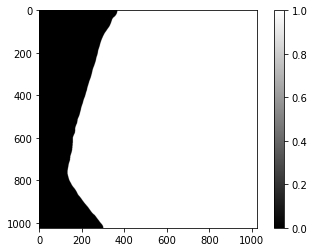

In [35]:
particle_mask_new=np.zeros((1024,1024))
particle_mask_heavily_smoothed=scipy.ndimage.gaussian_filter(ZrO2,sigma=10)
# plt.imshow(particle_mask_heavily_smoothed)
# plt.colorbar()

for i in range(1024):
  for j in range(int(1024-2*margin_size)):
     if particle_mask_heavily_smoothed[i,j]>1.5e4:
        particle_mask_new[i,int(j+2*margin_size)]=1

plt.imshow(particle_mask_new)
plt.colorbar()

In [36]:
atomXY=np.zeros((1,2))

for i, (x,y) in enumerate(atomXY_temp):
   if x>=margin_size and x<=1024-margin_size and y>=margin_size and y<=1024-margin_size and particle_mask_new[x,y]>0:
      atomXY=np.vstack([atomXY,[x,y]])
   
atomXY=np.delete(atomXY,0,axis=0)


In [37]:
atomXY[0]

array([1004.,  905.])

In [38]:
atomXY.shape

(4252, 2)

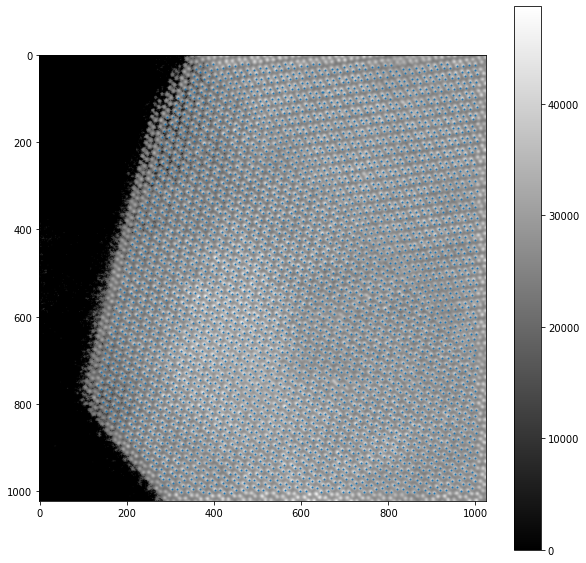

In [39]:
plt.figure(figsize=(10,10))
plt.scatter(atomXY[:,1],atomXY[:,0],s=1)
plt.imshow(im)
plt.colorbar()

In [40]:
# Center_X=im.shape[0]/2
# Center_Y=im.shape[1]/2

start from the center of the image regardless of atom positions

In [41]:
Center_X=round(im.shape[0]/2)
Center_Y=round(im.shape[1]/2)
print(Center_X,Center_Y)

512 512


In [42]:
r_vectors

array([[ 18.96296296,  16.        ],
       [-18.96296296, -16.        ],
       [ 51.2       , -12.19047619],
       [-51.2       ,  12.19047619]])

In [43]:
NX=round(Center_X/abs(r_vectors[:,0]).min())
NY=round(Center_Y/abs(r_vectors[:,1]).min())
print(NX,NY)

27 42


In [44]:
im_stack=np.zeros((window.shape[0],window.shape[1],1))
im_stack.shape

(55, 55, 1)

In [45]:
im_stack=np.zeros((window.shape[0],window.shape[1],1))
im_coord=np.zeros((1,2))
for nx in range(NX):
  for ny in range(NY):
    for r_v in r_vectors:
       CX,CY=r_v[0]*nx+Center_X,r_v[1]*ny+Center_Y
       CX=int(CX)
       CY=int(CY)
      #  print(CX,CY)
       if CX+15+window.shape[0]/2<im.shape[0] and CX-15-window.shape[0]/2>0 and CY+15+window.shape[1]/2<im.shape[1] and CY-15-window.shape[1]/2>0:
          # print(CX,CY)
          cropped_unit_cell,area_min,CX_opt,CY_opt=crop_unit_cell(im,CX,CY)
          if area_min>0:
             im_stack=np.append(im_stack, np.atleast_3d(cropped_unit_cell), axis=2)
             im_coord=np.vstack([im_coord,[CX_opt,CY_opt]])
im_stack=np.delete(im_stack, 0, axis=2)
im_coord=np.delete(im_coord,0,axis=0)

In [46]:
im_stack.shape

(55, 55, 1941)

[519. 198.]


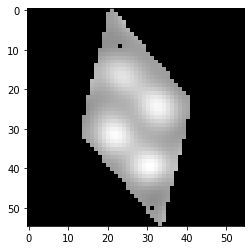

In [47]:
plt.imshow(im_stack[:,:,100])
print(im_coord[100,:])

# Center of the found unit cells (needs improvement)
The unit cells are found by a translational vector which is equal to a and c i.e. the crystallographic unit vectors in real space 

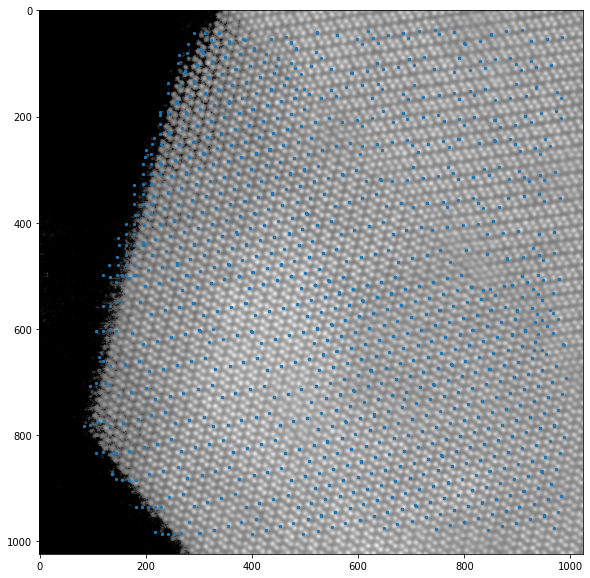

In [48]:
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.scatter(im_coord[:,1],im_coord[:,0],s=5)

Take the atom positions as the initial centers of the unit cell (this will cause redundancy but won't miss out anything) 

In [49]:
atomXY.shape

(4252, 2)

In [50]:
im_stack2=np.zeros((window.shape[0],window.shape[1],1))
im_coord2=np.zeros((1,2))
for (CX,CY) in atomXY[:,:]:
       CX=int(CX)
       CY=int(CY)
       print(CX,CY)
       if CX+15+window.shape[0]/2<im.shape[0] and CX-15-window.shape[0]/2>0 and CY+15+window.shape[1]/2<im.shape[1] and CY-15-window.shape[1]/2>0:
          cropped_unit_cell,area_min,CX_opt,CY_opt=crop_unit_cell(im,CX,CY)
          if area_min>0 : #and (CX_opt,CY_opt) not in im_coord2:
             im_stack2=np.append(im_stack2, np.atleast_3d(cropped_unit_cell), axis=2)
             im_coord2=np.vstack([im_coord2,[CX_opt,CY_opt]])
im_stack2=np.delete(im_stack2, 0, axis=2)
im_coord2=np.delete(im_coord2,0,axis=0)

1004 905
1004 893
1004 440
1004 424
1004 389
1003 858
1003 843
1003 376
1003 325
1002 807
1002 795
1002 760
1002 745
1002 709
1002 696
1002 646
1002 341
1001 661
1000 611
999 982
999 967
999 598
999 548
998 932
998 919
998 563
998 513
998 500
998 466
998 450
997 884
997 415
997 402
996 868
996 367
996 351
996 316
995 834
995 821
995 771
995 303
994 786
994 735
994 672
993 993
993 722
993 687
993 637
992 624
992 573
991 958
991 946
991 590
991 539
991 476
990 911
990 895
990 526
990 492
990 441
989 860
989 428
989 393
989 378
989 330
988 848
988 797
988 342
987 812
987 761
987 749
987 714
987 697
987 295
987 280
986 662
986 650
985 984
985 615
985 599
984 972
984 565
984 552
984 502
983 937
983 921
983 518
983 404
982 886
982 873
982 468
982 455
982 420
982 370
981 823
981 775
981 726
981 356
981 306
980 838
980 787
980 321
979 740
979 689
979 677
978 641
978 626
977 998
977 947
977 591
977 579
976 963
976 544
976 528
975 912
975 900
975 493
975 481
975 430
974 865
974 446
974 395
974 3

In [51]:
im_stack2.shape

(55, 55, 3957)

[944. 976.]


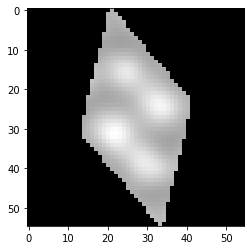

In [52]:
plt.imshow(im_stack2[:,:,100])
print(im_coord2[100,:])

# Center of the found unit cells by method 2 (needs improvement)
The starting point of refining the unit cell center is the atom positions

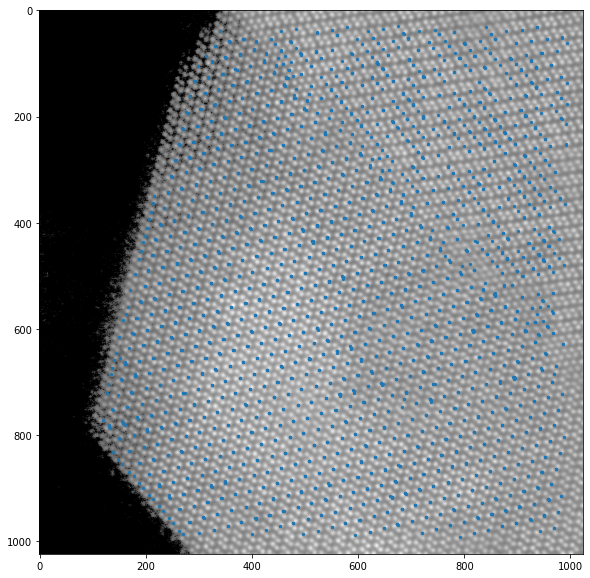

In [53]:
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.scatter(im_coord2[:,1],im_coord2[:,0],s=5)

A better idea may be related to a multi-channel Inverse FFT

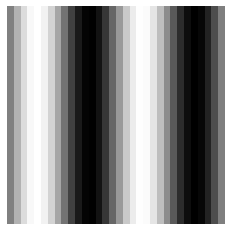

In [54]:
import numpy as np
import matplotlib.pyplot as plt

N = 32
x = np.linspace(-np.pi*2,np.pi*2., N)
sine1D = 128 + (128.0 * np.sin(x))
sine1D = np.uint8(sine1D)
sine2D1 = np.ndarray((N,N), dtype=np.uint8)
for i in range(N):
    sine2D1[i]= np.roll(sine1D,0,axis=-1)  # shift the 1D sin data by -i, -i increases with rows
plt.imshow(sine2D1, cmap='gray')
plt.axis('off')
# plt.colorbar()
plt.show()


In [55]:
sine1D.shape

(32,)

(-0.5, 31.5, 31.5, -0.5)

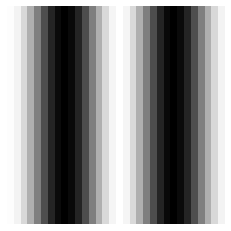

In [56]:
FFT_Test=scipy.fft.fft2(sine2D1)
patterson=scipy.fft.ifft2(abs(FFT_Test)**2)
patt1=scipy.fft.ifftshift(patterson)

plt.imshow(abs(patt1))
plt.axis('off')

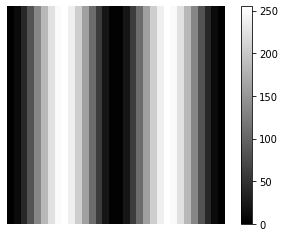

In [57]:
N = 32
x = np.linspace(-np.pi*2,np.pi*2, N)
sine1D = 128 + (128.0 * np.sin(x * 1-np.pi/2))
sine1D = np.uint8(sine1D)
sine2D2 = np.ndarray((N,N), dtype=np.uint8)
for i in range(N):
    sine2D2[i]= np.roll(sine1D,0)  # shift the 1D sin data by -i, -i increases with rows
plt.imshow(sine2D2, cmap='gray')
plt.colorbar()
plt.axis('off')
plt.show()



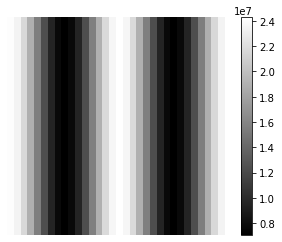

In [58]:
FFT_Test=scipy.fft.fft2(sine2D2)
patterson=scipy.fft.ifft2(abs(FFT_Test)**2)
patt2=scipy.fft.ifftshift(patterson)

plt.imshow(abs(patt2))
plt.axis('off')
plt.colorbar()

(-0.5, 31.5, 31.5, -0.5)

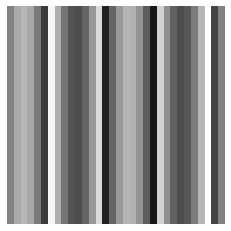

In [59]:
plt.imshow(abs(sine2D1-sine2D2),vmin=0)
# plt.colorbar()
plt.axis('off')

(-0.5, 31.5, 31.5, -0.5)

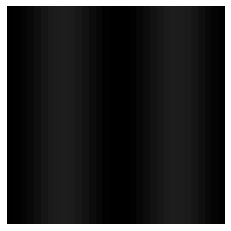

In [60]:
plt.imshow(abs(patt1-patt2),vmax=1e7)
# plt.colorbar()
plt.axis('off')


# Starting from here



Now, I come up with the following idea:

**Multi-channel IFFT**

1. Identify all the atom positions
2. Find the shortest k_vectors from the FFT, say 3 basis k_vectors, k1, k2, k3
Thus, we also know the corresponding spacings in real space d1, d2, d3
3. Take the IFFT for each k_vector
4. At each atom position, crop the IFFT images IFFT1, IFFT2 and IFFT3 with three squared boxes with d1, d2, and d3
5. Take the Patterson function of each cropped image and form P1, P2 and P3
6. Then, we have a 3-channel tensor for each atom, since each channel has a different dimension we fill the empty elements with zeros.
7. Then, we are ready to do classfications. We may expect that this classfication could give different domains with different unit cells and twin boundaries. Thus, we can classify different phases. Each phase correspond to 2 of the 3 channels. And we can also detect defects within each phase.

For step 6, we can alternatively do a rotation for each IFFT and scale it to the same size.

## 1. Identify all the atom positions

In [61]:
atomXY.shape

(4252, 2)

## 2.Find the shortest k_vectors from the FFT, say 3 basis k_vectors, k1, k2, k3 Thus, we also know the corresponding spacings in real space d1, d2, d3

In [62]:
k_vectors=np.zeros((6,2))

for i in range(6):
   k_vectors[i,0]=sorted_k_peaks[i+1,0]-FFT_X/2
   k_vectors[i,1]=sorted_k_peaks[i+1,1]-FFT_Y/2

print(k_vectors)

[[-41.  -6.]
 [ 41.   6.]
 [-27.  32.]
 [ 27. -32.]
 [-10. -42.]
 [ 10.  42.]]


In [63]:
window=np.zeros((55,55))
shift_center=math.floor(window.shape[0]/2)
cos_alpha_list=np.zeros((k_vectors.shape[0]))
sin_alpha_list=np.zeros((k_vectors.shape[0]))

for i in range(k_vectors.shape[0]):
  cos_alpha_list[i]=k_vectors[i,0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
  sin_alpha_list[i]=k_vectors[i,1]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
print(cos_alpha_list)

[-0.98946106  0.98946106 -0.64487094  0.64487094 -0.23162053  0.23162053]


In [64]:
r_vectors=np.zeros((6,2))
for i in range(6):
   d_spacing=ZrO2.shape[0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
   r_vectors[i,0]=-(d_spacing/2)/cos_alpha_list[i]
   r_vectors[i,1]=(d_spacing/2)/sin_alpha_list[i]
print('tranlation by')
print(r_vectors)


tranlation by
[[ 12.48780488 -85.33333333]
 [-12.48780488  85.33333333]
 [ 18.96296296  16.        ]
 [-18.96296296 -16.        ]
 [ 51.2        -12.19047619]
 [-51.2         12.19047619]]


## 3.Take the IFFT for each k_vector

In [65]:
FFT.shape

(1024, 1024)

In [66]:
def FFT_mask(k_vector_i,r_mask):
   k_x=k_vector_i[0]
   k_y=k_vector_i[1]
   FFT_mask=np.zeros((FFT.shape[0],FFT.shape[1]))
   for i in range(-r_mask,r_mask):
     for j in range(-r_mask,r_mask):
        if i**2+j**2<=r_mask**2:
          #  print(k_x,k_y)
           FFT_mask[int(FFT.shape[0]/2+k_x+i),int(FFT.shape[1]/2+k_y+j)]=1
           FFT_mask[int(FFT.shape[0]/2-k_x+i),int(FFT.shape[1]/2-k_y+j)]=1
   
   return FFT_mask

[-41.  -6.]


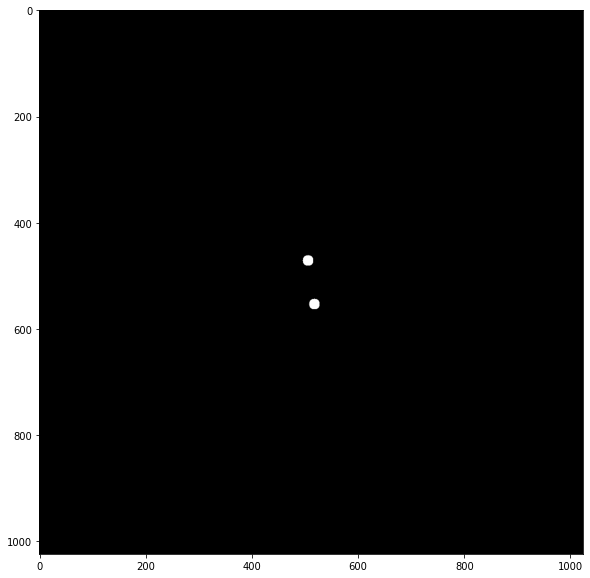

In [67]:
r_mask=20
k_vector_i=k_vectors[0,:]
print(k_vector_i)
plt.figure(figsize=(10,10))
plt.imshow(FFT_mask(k_vectors[0,:],r_mask=10))


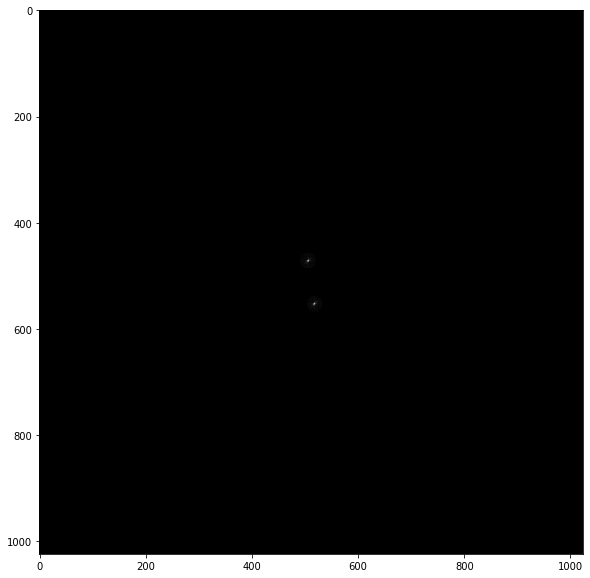

In [68]:
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift*FFT_mask(k_vectors[0,:],r_mask=15)))

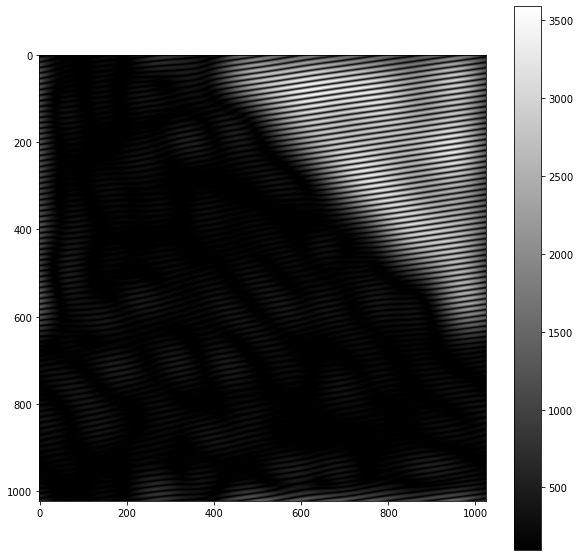

In [69]:
plt.figure(figsize=(10,10))
plt.imshow(abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[0,:],r_mask=7))),vmin=100)
plt.colorbar()

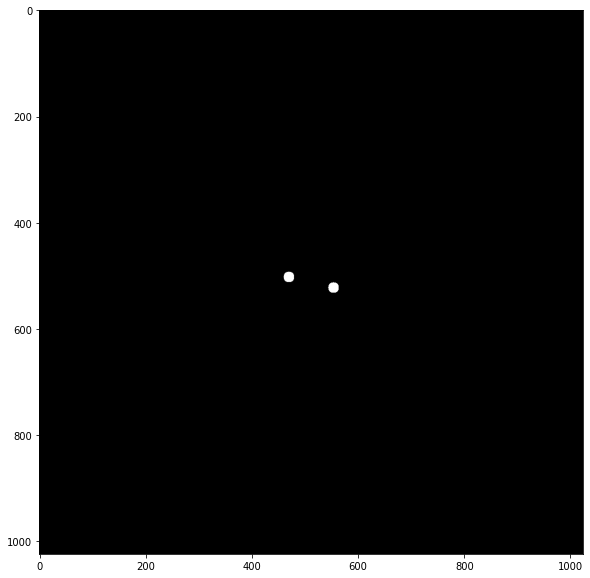

In [70]:
plt.figure(figsize=(10,10))
plt.imshow(FFT_mask(k_vectors[5,:],r_mask=10))

In [71]:
IFFT_1=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[0,:],r_mask=7)))
IFFT_2=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[2,:],r_mask=7)))
IFFT_3=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[4,:],r_mask=7)))

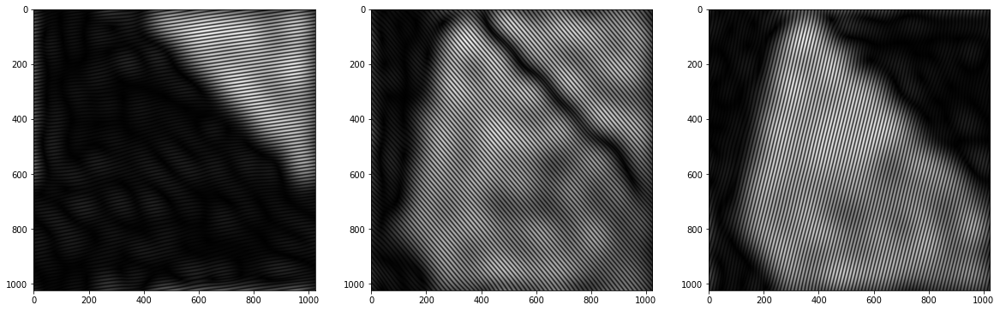

In [72]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT_1)
ax2.imshow(IFFT_2)
ax3.imshow(IFFT_3)

Rotate the three IFFT images by the angles between the k_vector and the horizontal direction. In the meantime, rotate the atomXY and get the corresponding coordinates in the new images.

These alpha are the angle between the normal vectors to the planes and the vertical direction

In [73]:
cos_alpha_list=np.zeros((k_vectors.shape[0]))
sin_alpha_list=np.zeros((k_vectors.shape[0]))

for i in range(k_vectors.shape[0]):
  cos_alpha_list[i]=k_vectors[i,0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
  sin_alpha_list[i]=k_vectors[i,1]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
print(cos_alpha_list)
print(sin_alpha_list)

[-0.98946106  0.98946106 -0.64487094  0.64487094 -0.23162053  0.23162053]
[-0.14479918  0.14479918  0.76429148 -0.76429148 -0.97280621  0.97280621]


In [74]:
alpha_list=np.zeros((3))
for i in range(3):
  alpha_list[i]=math.atan(sin_alpha_list[2*i]/cos_alpha_list[2*i])*180/math.pi
print(alpha_list)

[  8.32565033 -49.84400038  76.60750225]


In [75]:
rot_angles=-alpha_list
print(rot_angles)

[ -8.32565033  49.84400038 -76.60750225]


In [76]:
from scipy.ndimage import rotate

def rot(image, xy, angle):
    im_rot = rotate(image,angle)
    xy_new=xy.copy()
    org_center = (np.array(image.shape[:2][::-1]))/2
    rot_center = (np.array(im_rot.shape[:2][::-1]))/2
    for i,x_y in enumerate(xy):
      org=x_y-org_center
      a = -np.deg2rad(angle) # a minus sign works because the "row=x, col=y" convention is adopted here
      new = np.array([org[0]*np.cos(a) + org[1]*np.sin(a),
            -org[0]*np.sin(a) + org[1]*np.cos(a)])
      xy_new[i,:]=new+rot_center
    
    return im_rot, xy_new



In [77]:
np.array(ZrO2.shape[:2][::-1])

array([1024, 1024])

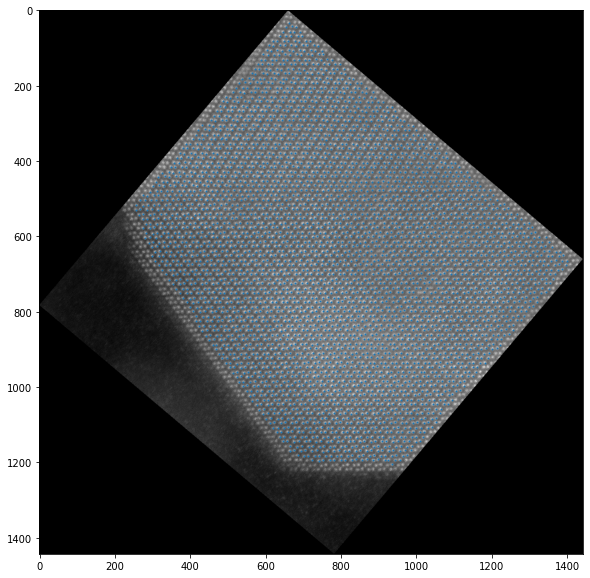

In [78]:
data_rot, xy_new= rot(ZrO2, atomXY, rot_angles[1])
plt.figure(figsize=(10,10))
plt.imshow(data_rot)
plt.scatter(xy_new[:,1],xy_new[:,0],s=1)


In [79]:
xy_new.shape

(4252, 2)

In [80]:
atomXY.shape

(4252, 2)

In [81]:
IFFT1_rot, atomXY_rot1= rot(IFFT_1, atomXY, rot_angles[0])
IFFT2_rot, atomXY_rot2= rot(IFFT_2, atomXY, rot_angles[1])
IFFT3_rot, atomXY_rot3= rot(IFFT_3, atomXY, rot_angles[2])
print(IFFT1_rot.shape,IFFT2_rot.shape,IFFT3_rot.shape)
print(atomXY_rot1.shape,atomXY_rot2.shape,atomXY_rot3.shape)

(1161, 1161) (1443, 1443) (1233, 1233)
(4252, 2) (4252, 2) (4252, 2)


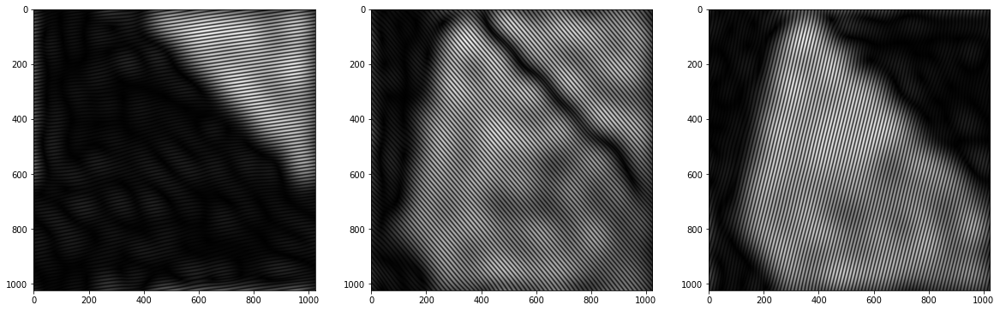

In [82]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT_1)
ax2.imshow(IFFT_2)
ax3.imshow(IFFT_3)

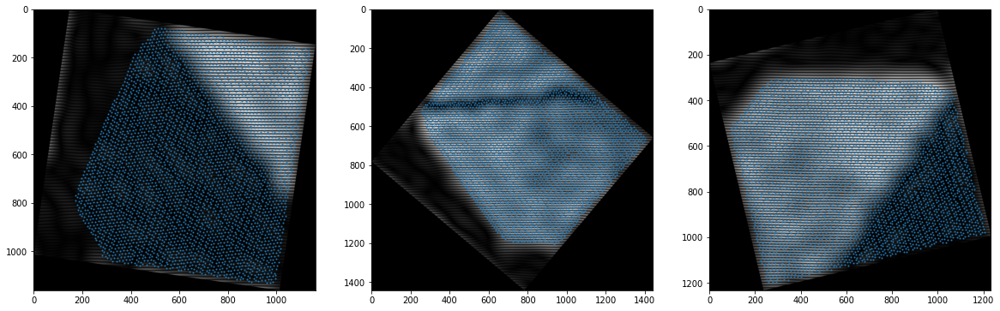

In [83]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT1_rot)
ax1.scatter(atomXY_rot1[:,1],atomXY_rot1[:,0],s=1)
ax2.imshow(IFFT2_rot)
ax2.scatter(atomXY_rot2[:,1],atomXY_rot2[:,0],s=1)
ax3.imshow(IFFT3_rot)
ax3.scatter(atomXY_rot3[:,1],atomXY_rot3[:,0],s=1)

In [84]:
d_spacings=np.zeros((3))
for i in range(3):
  d_spacings[i]=round(ZrO2.shape[0]/math.sqrt(k_vectors[2*i,0]**2+k_vectors[2*i,1]**2))
print(d_spacings)

[25. 24. 24.]


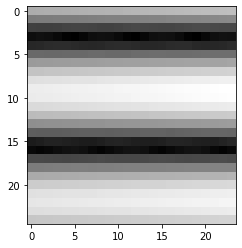

In [85]:
plt.imshow(IFFT1_rot[400:int(400+d_spacings[0]),1000:int(1000+d_spacings[1])])

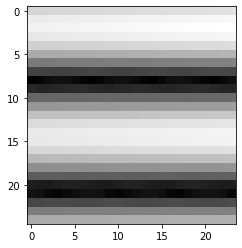

In [86]:
plt.imshow(IFFT1_rot[420:int(420+d_spacings[0]),1010:int(1010+d_spacings[1])])

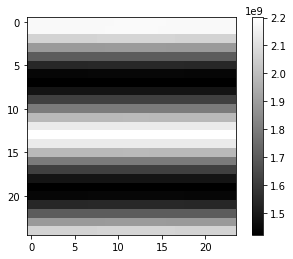

In [87]:
FFT_T1=scipy.fft.fft2(IFFT1_rot[400:int(400+d_spacings[0]),1000:int(1000+d_spacings[1])])
patterson1=scipy.fft.ifft2(abs(FFT_T1)**2)
patt1=scipy.fft.ifftshift(patterson1)

plt.imshow(abs(patt1))
plt.colorbar()

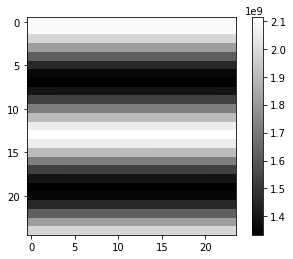

In [88]:
FFT_T2=scipy.fft.fft2(IFFT1_rot[420:int(420+d_spacings[0]),1010:int(1010+d_spacings[1])])
patterson2=scipy.fft.ifft2(abs(FFT_T2)**2)
patt2=scipy.fft.ifftshift(patterson2)

plt.imshow(abs(patt2))
plt.colorbar()

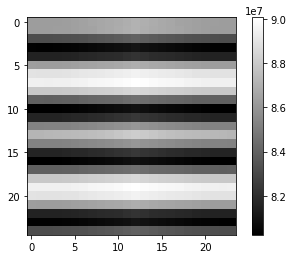

In [89]:
plt.imshow(abs(patt1-patt2))
plt.colorbar()

## 4. At each atom position, crop the IFFT images IFFT1, IFFT2 and IFFT3 with three squared boxes with d1, d2, and d3
## 5. Take the Patterson function of each cropped image and form P1, P2 and P3

In [90]:
def Patterson(im):
   FFT=scipy.fft.fft2(im)
   patterson=scipy.fft.ifft2(abs(FFT)**2)
   patt=scipy.fft.ifftshift(patterson)
   return abs(patt)

In [91]:
im_stack_IFFT1=np.zeros((int(atomXY_rot1.shape[0]),int(d_spacings[0]),int(d_spacings[0])))
for i, (x,y) in enumerate(atomXY_rot1):
  d_half=d_spacings[0]/2
  im_temp=IFFT1_rot[int(x-d_half):int(x+d_half),int(y-d_half):int(y+d_half)]
  im_stack_IFFT1[i,:,:]=Patterson(im_temp)

[ 228.44492674 1102.98370826]


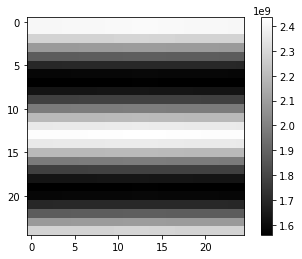

In [92]:
plt.imshow(im_stack_IFFT1[4000,:,:])
plt.colorbar()
print(atomXY_rot1[4000])

In [93]:
img_stack=im_stack_IFFT1
img_stack_flat=img_stack.reshape(img_stack.shape[0],img_stack.shape[1]*img_stack.shape[2])
img_stack_flat.shape

(4252, 625)

# 6. Do the classification using SVM 

In [94]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit(img_stack_flat[:,:])              
# pca.fit(img_stack_init_flat[:,:])
explained_var = pca.explained_variance_ratio_
sum=0
nc=0
i=0
while sum<0.98:
    print(str(i+1)+'th component accounts for:'+str(explained_var[i]))
    sum=sum+explained_var[i]
    nc=nc+1
    i=i+1
print(str(nc)+'components can explain'+str(sum)+'of the behavior')

NC=nc
pca = PCA(n_components=NC)
X_vec_t = pca.fit_transform(img_stack_flat[:,:])
components = pca.components_

print('shape of the components is')
print(components.shape)
print(X_vec_t.shape)

1th component accounts for:0.9999731928171464
1components can explain0.9999731928171464of the behavior
shape of the components is
(1, 625)
(4252, 1)


In [95]:
from sklearn.svm import OneClassSVM
clf=OneClassSVM(gamma='scale').fit(X_vec_t)
cate=clf.predict(X_vec_t)
scores=clf.score_samples(X_vec_t)

(array([5.16667414e-05, 7.75001121e-05, 0.00000000e+00, 5.16667414e-05,
        1.29166854e-04, 0.00000000e+00, 0.00000000e+00, 7.75001121e-05,
        2.58333707e-05, 7.75001121e-05, 1.29166854e-04, 1.03333483e-04,
        1.29166854e-04, 1.80833595e-04, 5.16667414e-05, 1.55000224e-04,
        1.29166854e-04, 1.03333483e-04, 1.80833595e-04, 1.29166854e-04,
        1.29166854e-04, 1.03333483e-04, 2.06666966e-04, 2.58333707e-05,
        1.03333483e-04, 1.55000224e-04, 1.29166854e-04, 1.55000224e-04,
        1.29166854e-04, 1.29166854e-04, 2.32500336e-04, 3.35833819e-04,
        1.03333483e-04, 2.58333707e-04, 1.29166854e-04, 1.55000224e-04,
        2.58333707e-04, 3.10000449e-04, 1.80833595e-04, 2.84167078e-04,
        3.10000449e-04, 3.10000449e-04, 3.87500561e-04, 3.61667190e-04,
        4.39167302e-04, 2.94500426e-03, 1.80833595e-03, 2.27333662e-03,
        2.19583651e-03, 2.99667100e-03, 4.77917358e-03, 1.29166854e-04,
        1.80833595e-04, 1.29166854e-04, 5.16667414e-05, 5.166674

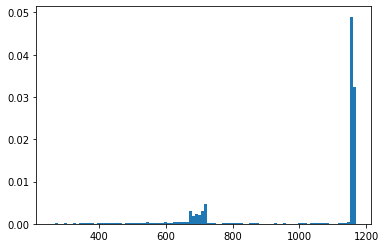

In [96]:
plt.hist(scores,density=True,bins=100)

In [97]:
# lower_limit=scores.mean()-3*scores.std()
lower_limit=800
print(lower_limit)

800


In [98]:
color_outlier=np.zeros((img_stack_flat.shape[0]))
for i in range(color_outlier.shape[0]):
  if scores[i]>=lower_limit:
    color_outlier[i]=1
  if scores[i]<lower_limit:
    color_outlier[i]=-1


<Figure size 432x288 with 0 Axes>

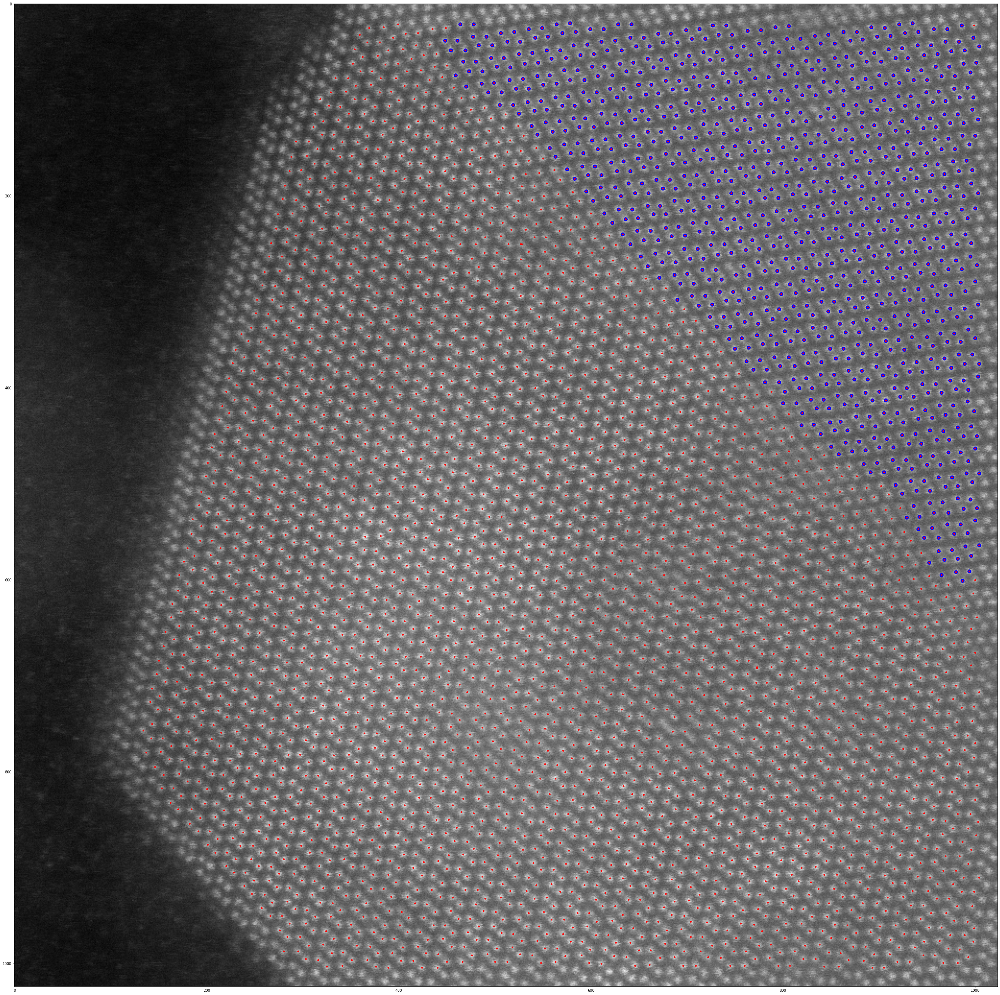

In [99]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(50,50))
plt.imshow(ZrO2)
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=95,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=15,c='r')

It seems to work well!
Maybe a few things may be adjusted:
1. masks for spots in FFT could include circles with subpixel resolution
2. The the sign of the support vectors (semi-supervised or some other tunning or parameters)
3. Classification of two other IFFT (IFFT2 and IFFT3)